## Check for GPU availability
This code checks if a GPU is available and prints the GPU's name if it is. Otherwise, it prints a message indicating that no GPU is available and the CPU will be used instead.

In [1]:
import torch

# Check for GPU availability
if torch.cuda.is_available():
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    print("No GPU available, using the CPU instead.")

# Define device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Using GPU: NVIDIA GeForce RTX 3080


## Setting up the dataset 
It downloads and sets up a directory 'data' the first time this cell is executed

Total number of training images: 60000
Total number of testing images: 10000
Total number of training images in subset: 60000
Total number of testing images in subset: 10000
Training data range: min = 0.0, max = 1.0
Testing data range: min = 0.0, max = 1.0


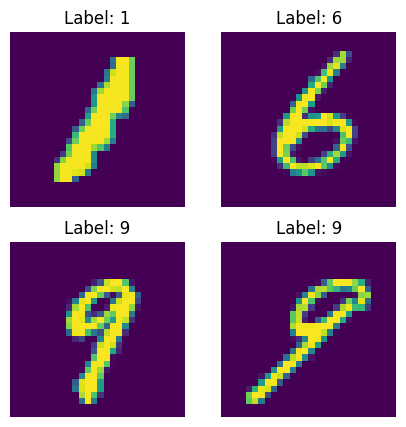

In [2]:
from mnist_loader import load_mnist, plot_sample_images

# Load the MNIST dataset
train_loader, test_loader = load_mnist(num_samples_train=60000, num_samples_test=10000, batch_size=64)  

# Plot sample images
plot_sample_images(train_loader)

## Initialize the model

In [3]:
from enhanced_vae_model import EnhancedVAE, loss_function, init_model

# Initialize the model and optimizer
model, optimizer = init_model(latent_dim=10, device=device)

## Train the model

In [4]:
# from vae_training import VAETrainer, LossPlotter

# # Assuming model, optimizer, train_loader, and device are already defined
# trainer = VAETrainer(model, optimizer, train_loader, device, kld_weight=1.0)
# train_losses = trainer.train(epochs=100, log_interval=50)

# plotter = LossPlotter()
# plotter.plot_losses(train_losses, scale='linear')  # Change 'linear' to 'log' for log scale

## Load the model from provided PyTorch state dictionary (.pth) file

Last number in file name describes the value of used latent dimensions

In [5]:
def load_model(model, path):
    # Check if CUDA is available
    if torch.cuda.is_available():
        # Load the model weights to GPU
        state_dict = torch.load(path)
    else:
        # Load the model weights to CPU
        state_dict = torch.load(path, map_location=torch.device('cpu'))
    
    # Load the state dict into the model
    model.load_state_dict(state_dict)
    
    # Set the model to evaluation mode
    model.eval()
    
    return model

# Example usage
model_path = 'vae_model_gauss_enh10.pth'
try:
    model = load_model(model, model_path)
    print("Model loaded successfully.")
except Exception as e:
    print(f"An error occurred while loading the model: {e}")

Model loaded successfully.


## Display original and reconstructed images with labels

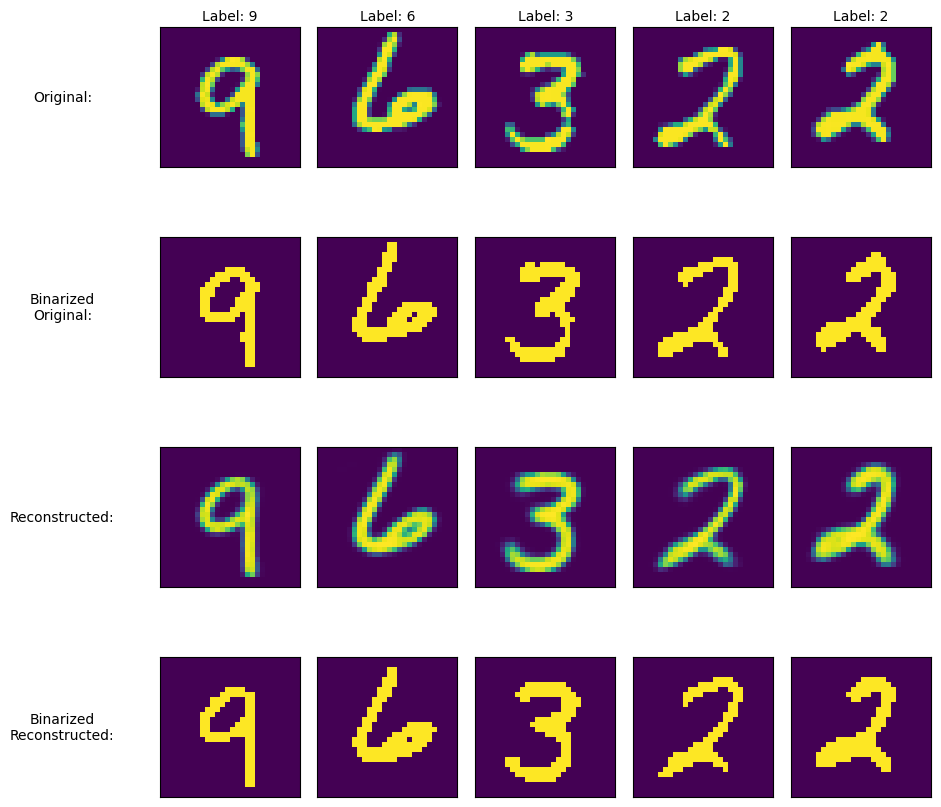

In [6]:
import random
import matplotlib.pyplot as plt
import numpy as np

def binarize_image(image, threshold=0.5):
    return (image > threshold).astype(np.float32)

def visualize_results(model, data_loader, num_images=10, device='cuda', seed=None):
    if seed is not None:
        torch.manual_seed(seed)
        random.seed(seed)
        np.random.seed(seed)
        if torch.cuda.is_available():
            torch.cuda.manual_seed(seed)
            torch.cuda.manual_seed_all(seed)

    model.eval()
    
    # Get all data from the loader
    all_data = []
    all_labels = []
    with torch.no_grad():
        for data, labels in data_loader:
            all_data.append(data)
            all_labels.append(labels)
    
    all_data = torch.cat(all_data, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    
    # Always randomly select indices, but use the set seed if provided
    indices = random.sample(range(len(all_data)), num_images)
    
    # Get the selected data and labels
    selected_data = all_data[indices].to(device)
    selected_labels = all_labels[indices]
    
    # Get reconstructions
    with torch.no_grad():  # Ensure no gradients are computed
        recon, _, _ = model(selected_data)

    fig, axes = plt.subplots(4, num_images, figsize=(2 * num_images, 10))
    plt.subplots_adjust(wspace=0.1, hspace=0.5)

    row_labels = ['Original:', 'Binarized\nOriginal:', 'Reconstructed:', 'Binarized\nReconstructed:']
    
    for i in range(num_images):
        original = selected_data[i].cpu().numpy().reshape(28, 28)
        reconstructed = recon[i].cpu().detach().numpy().reshape(28, 28)
        
        images = [
            original,
            binarize_image(original),
            reconstructed,
            binarize_image(reconstructed)
        ]
        
        for j, img in enumerate(images):
            ax = axes[j, i]
            ax.imshow(img, cmap='viridis')
            ax.set_xticks([])
            ax.set_yticks([])
            
            if i == 0:
                ax.set_ylabel(row_labels[j], rotation=0, labelpad=70, fontsize=10, va='center')
            
            if j == 0:
                ax.set_title(f"Label: {selected_labels[i].item()}", fontsize=10, pad=5)

    plt.show()

# Example usage
num_images_to_display = 5
seed_value = 42  # Choose any integer value
visualize_results(model, test_loader, num_images=num_images_to_display, seed=seed_value)

## Generate numbers by sampling from a standard normal distribution

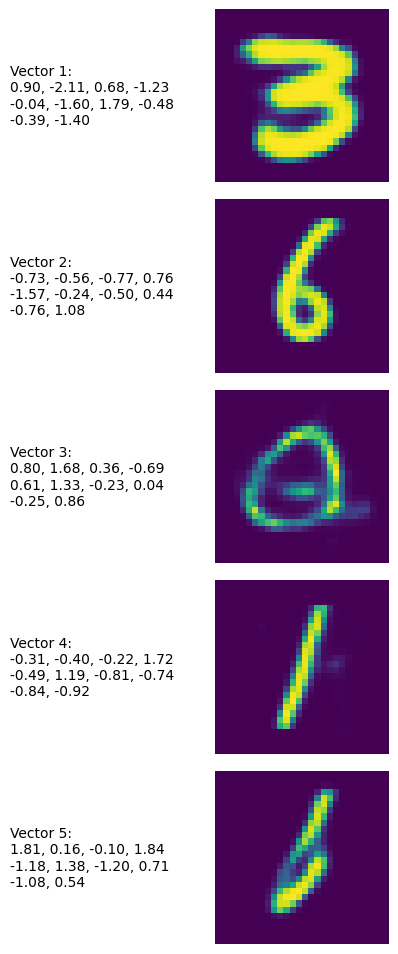

In [7]:
import torch
import matplotlib.pyplot as plt
import numpy as np

def generate_random_numbers(model, num_samples=5):
    latent_dim_size = model.get_latent_dim()
    model.eval()
    with torch.no_grad():
        z = torch.randn(num_samples, latent_dim_size).to(next(model.parameters()).device)
        samples = model.decode(z).cpu()
    
    fig, axs = plt.subplots(num_samples, 2, figsize=(4, 2*num_samples), gridspec_kw={'width_ratios': [1, 0.7]})
    
    # Move the entire figure to the left
    fig.subplots_adjust(left=0)
    
    for i in range(num_samples):
        # Left column: vector description
        vector_str = "Vector {}:\n".format(i+1)
        for j, val in enumerate(z[i].cpu().numpy()):
            vector_str += "{:.2f}".format(val)
            if (j+1) % 4 == 0:  # New line every 4 numbers
                vector_str += "\n"
            elif j != len(z[i])-1:
                vector_str += ", "
        
        axs[i, 0].text(0, 0.5, vector_str, wrap=True, fontsize=10, verticalalignment='center')
        axs[i, 0].axis('off')
        
        # Right column: rendered image
        axs[i, 1].imshow(samples[i].numpy().reshape(28, 28), cmap='viridis', origin='upper')
        axs[i, 1].axis('off')
    
    # Adjust the layout to bring columns closer together and align to the left
    plt.tight_layout()
    plt.subplots_adjust(wspace=-0.3, hspace=0.1, top=0.95, left=0)
    plt.show()

# Generate and visualize random numbers
generate_random_numbers(model, num_samples=5)

## Explore the latent space interactively with sliders

In [77]:
import torch
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, VBox, HBox
import ipywidgets as widgets

def create_vae_explorer(model):
    model.eval()
    latent_dim_size = model.get_latent_dim()
    
    def update_image(**z_values):
        z = torch.zeros(1, latent_dim_size)
        for i, val in enumerate(z_values.values()):
            z[0, i] = val
        
        with torch.no_grad():
            z = z.to(next(model.parameters()).device)
            sample = model.decode(z).cpu()
        
        plt.figure(figsize=(4, 4))
        plt.imshow(sample[0].numpy().reshape(28, 28), cmap='viridis')
        plt.axis('off')
        plt.show()
    
    sliders = {f'z{i}': FloatSlider(min=-4, max=4, step=0.1, description=f'z{i}') 
               for i in range(latent_dim_size)}
    
    interact_manual = interact(update_image, **sliders)
    
    return interact_manual

# Usage:
# Assuming you have already loaded your model:
# from enhanced_vae_model import EnhancedVAE, loss_function, init_model
# model, optimizer = init_model(latent_dim=10, device=device)
# model = load_model(model, 'vae_model_gauss_enh10.pth')

# Then you can create and display the explorer:
explorer = create_vae_explorer(model)
display(explorer)

interactive(children=(FloatSlider(value=0.0, description='z0', max=4.0, min=-4.0), FloatSlider(value=0.0, desc…

<function __main__.create_vae_explorer.<locals>.update_image(**z_values)>

## Extract latent space activations with testing subset

In [9]:
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm

def extract_latent_activations(model, data_loader):
    device = next(model.parameters()).device  # Get the device from the model
    latent_dim = model.get_latent_dim()  # Get the latent dimension from the model
    model.eval()
    activations = []
    with torch.no_grad():
        for data, labels in tqdm(data_loader, desc="Extracting latent activations"):
            data = data.to(device)
            mu, logvar = model.encode(data)
            latent_space = model.reparameterize(mu, logvar)
            
            for i in range(len(labels)):
                digit = labels[i].item()
                latent_rep = latent_space[i].cpu().numpy()
                
                # Add overall latent representation
                activation_dict = {
                    'Digit': digit,
                    'Latent Representation': latent_rep
                }
                
                # Add individual neuron activations
                for j, activation in enumerate(latent_rep):
                    activation_dict[f'Latent Neuron {j}'] = j
                    activation_dict[f'Activation {j}'] = activation
                
                activations.append(activation_dict)
    
    return pd.DataFrame(activations)

# Extract latent activations
df = extract_latent_activations(model, test_loader)

# Display the first few rows of the DataFrame
display(df.head())

# Basic statistics of the activations
display(df.describe())

# You might want to save this DataFrame for further analysis
# df.to_csv('latent_activations.csv', index=False)

Extracting latent activations:   0%|          | 0/157 [00:00<?, ?it/s]

,Digit,Latent Representation,Latent Neuron 0,Activation 0,Latent Neuron 1,Activation 1,Latent Neuron 2,Activation 2,Latent Neuron 3,Activation 3,...,Latent Neuron 5,Activation 5,Latent Neuron 6,Activation 6,Latent Neuron 7,Activation 7,Latent Neuron 8,Activation 8,Latent Neuron 9,Activation 9
0,6,"[-0.7116117, -0.6771398, -0.7146745, 0.0092055...",0,-0.711612,1,-0.677140,2,-0.714674,3,0.009206,...,5,-1.118044,6,-1.174654,7,0.126294,8,-0.996488,9,1.071671
1,5,"[-0.8891738, -1.1389654, -0.15485333, 0.070896...",0,-0.889174,1,-1.138965,2,-0.154853,3,0.070897,...,5,0.359328,6,1.871133,7,-0.662070,8,1.082719,9,0.074459
2,9,"[-0.7882071, 0.5652538, -0.14026578, -2.003798...",0,-0.788207,1,0.565254,2,-0.140266,3,-2.003799,...,5,0.278057,6,0.093060,7,0.748531,8,0.619051,9,1.008803
3,3,"[1.2548436, -1.3705568, -0.8483224, -0.2979371...",0,1.254844,1,-1.370557,2,-0.848322,3,-0.297937,...,5,-0.392192,6,0.408749,7,0.566912,8,-2.116640,9,-1.267486
4,5,"[0.22066453, -0.6011318, 0.8992694, 0.41238007...",0,0.220665,1,-0.601132,2,0.899269,3,0.412380,...,5,0.455141,6,-0.027339,7,-0.643250,8,0.446320,9,1.237274


,Digit,Latent Neuron 0,Activation 0,Latent Neuron 1,Activation 1,Latent Neuron 2,Activation 2,Latent Neuron 3,Activation 3,Latent Neuron 4,...,Latent Neuron 5,Activation 5,Latent Neuron 6,Activation 6,Latent Neuron 7,Activation 7,Latent Neuron 8,Activation 8,Latent Neuron 9,Activation 9
count,10000.000000,10000.0,10000.000000,10000.0,10000.000000,10000.0,10000.000000,10000.0,10000.000000,10000.0,...,10000.0,10000.000000,10000.0,10000.000000,10000.0,10000.000000,10000.0,10000.000000,10000.0,10000.000000
mean,4.443400,0.0,-0.002419,1.0,-0.100248,2.0,-0.060811,3.0,-0.023623,4.0,...,5.0,0.032264,6.0,0.026879,7.0,0.026574,8.0,-0.004104,9.0,-0.048531
std,2.895865,0.0,1.013381,0.0,1.010376,0.0,1.026859,0.0,1.000365,0.0,...,0.0,1.011782,0.0,1.018860,0.0,0.974905,0.0,1.044597,0.0,1.006935
min,0.000000,0.0,-4.653174,1.0,-4.409722,2.0,-3.711752,3.0,-3.740630,4.0,...,5.0,-3.664104,6.0,-3.353715,7.0,-4.285854,8.0,-3.468509,9.0,-4.263757
25%,2.000000,0.0,-0.677533,1.0,-0.795634,2.0,-0.760010,3.0,-0.673242,4.0,...,5.0,-0.667866,6.0,-0.715984,7.0,-0.607530,8.0,-0.752548,9.0,-0.712022
50%,4.000000,0.0,0.014211,1.0,-0.087214,2.0,-0.054561,3.0,-0.064634,4.0,...,5.0,0.029283,6.0,0.031798,7.0,0.037289,8.0,-0.038913,9.0,-0.062622
75%,7.000000,0.0,0.690816,1.0,0.602475,2.0,0.630784,3.0,0.556521,4.0,...,5.0,0.724618,6.0,0.745129,7.0,0.679695,8.0,0.724344,9.0,0.595070
max,9.000000,0.0,3.872449,1.0,3.916787,2.0,2.941765,3.0,2.804083,4.0,...,5.0,4.104452,6.0,3.800568,7.0,3.912091,8.0,3.629915,9.0,4.362693


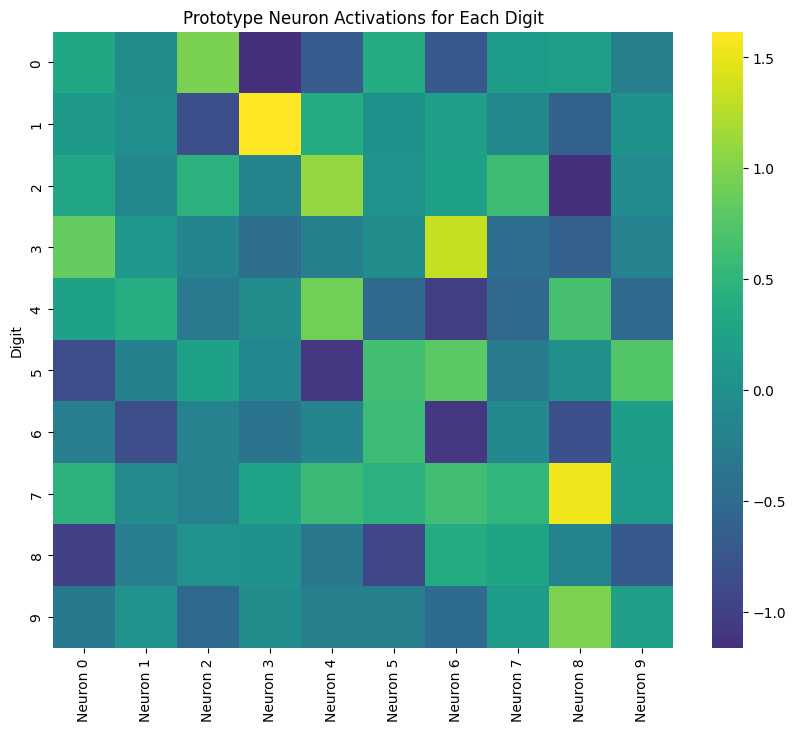

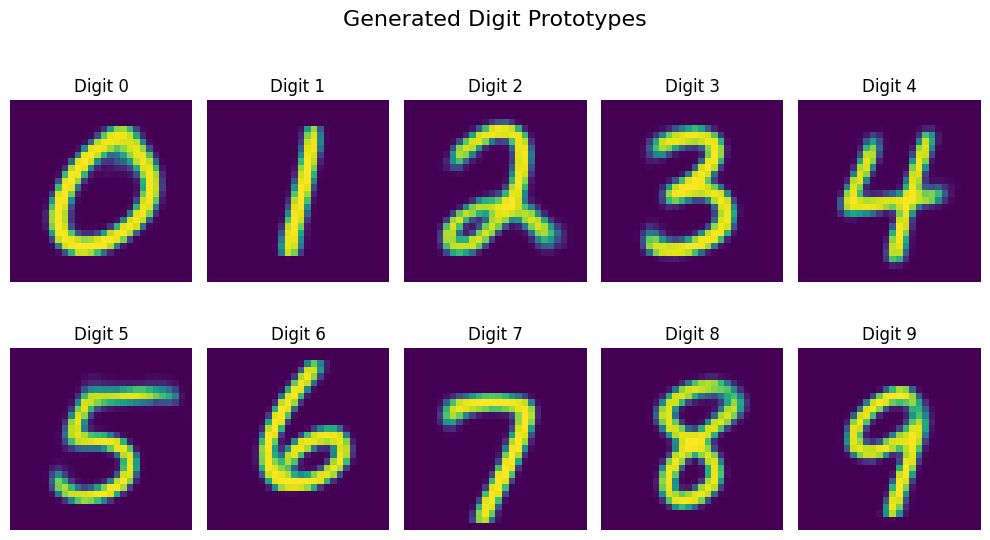

Digit 0:
neuron_values = {
    0: 0.304457,
    1: -0.053131,
    2: 0.963279,
    3: -1.162586,
    4: -0.673258,
    5: 0.377677,
    6: -0.722807,
    7: 0.152130,
    8: 0.203323,
    9: -0.236055,
}

Digit 1:
neuron_values = {
    0: 0.124370,
    1: -0.016019,
    2: -0.829219,
    3: 1.615767,
    4: 0.373140,
    5: 0.009824,
    6: 0.203378,
    7: -0.116881,
    8: -0.606145,
    9: 0.028587,
}

Digit 2:
neuron_values = {
    0: 0.291027,
    1: -0.109072,
    2: 0.453004,
    3: -0.170573,
    4: 1.085280,
    5: 0.045610,
    6: 0.223921,
    7: 0.614525,
    8: -1.159122,
    9: -0.068523,
}

Digit 3:
neuron_values = {
    0: 0.834538,
    1: 0.090875,
    2: -0.148053,
    3: -0.445896,
    4: -0.218736,
    5: -0.027535,
    6: 1.330427,
    7: -0.457418,
    8: -0.627776,
    9: -0.175204,
}

Digit 4:
neuron_values = {
    0: 0.215880,
    1: 0.387361,
    2: -0.298949,
    3: -0.058308,
    4: 0.915698,
    5: -0.530922,
    6: -0.999911,
    7: -0.538080,
    8: 0.664

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import pandas as pd
import numpy as np

def calculate_digit_prototypes(df):
    # Extract the activation columns
    activation_columns = [col for col in df.columns if col.startswith('Activation')]
    
    # Compute average activations per neuron per digit
    prototypes = df.groupby('Digit')[activation_columns].mean()
    
    # Rename columns to match the original format
    prototypes.columns = [f'Neuron {i}' for i in range(len(activation_columns))]
    
    return prototypes

def generate_prototype_images(model, prototypes):
    device = next(model.parameters()).device  # Get the device from the model
    model.eval()
    with torch.no_grad():
        # Convert prototypes to tensor
        prototype_tensors = torch.tensor(prototypes.values, dtype=torch.float32).to(device)
        
        # Generate images
        generated_images = model.decode(prototype_tensors).cpu().numpy()
        
        # Plot the generated images
        fig, axes = plt.subplots(2, 5, figsize=(10, 6))
        for i, ax in enumerate(axes.flat):
            ax.imshow(generated_images[i].reshape(28, 28), cmap='viridis')
            ax.set_title(f"Digit {i}")
            ax.axis('off')
        
        plt.suptitle("Generated Digit Prototypes", fontsize=16)
        plt.tight_layout()
        plt.show()

# Calculate prototypes
prototypes = calculate_digit_prototypes(df)

# Display the prototypes as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(prototypes, cmap='viridis', center=0, annot=False, fmt='.2f')
plt.title('Prototype Neuron Activations for Each Digit')
plt.ylabel('Digit')
plt.show()

# Generate and display prototype images
generate_prototype_images(model, prototypes)

# Print the prototype values for each digit in the specified format
for digit in range(10):
    print(f"Digit {digit}:")
    print(f"neuron_values = {{")
    for neuron_index, (neuron, value) in enumerate(prototypes.loc[digit].items()):
        print(f"    {neuron_index}: {value:.6f},")
    print("}\n")

# Iterate over selected neurons within a set value range

This visualization aims to help in understanding the feature mappings within selected neurons. By using digit prototype values, we can explore digit-specific features.

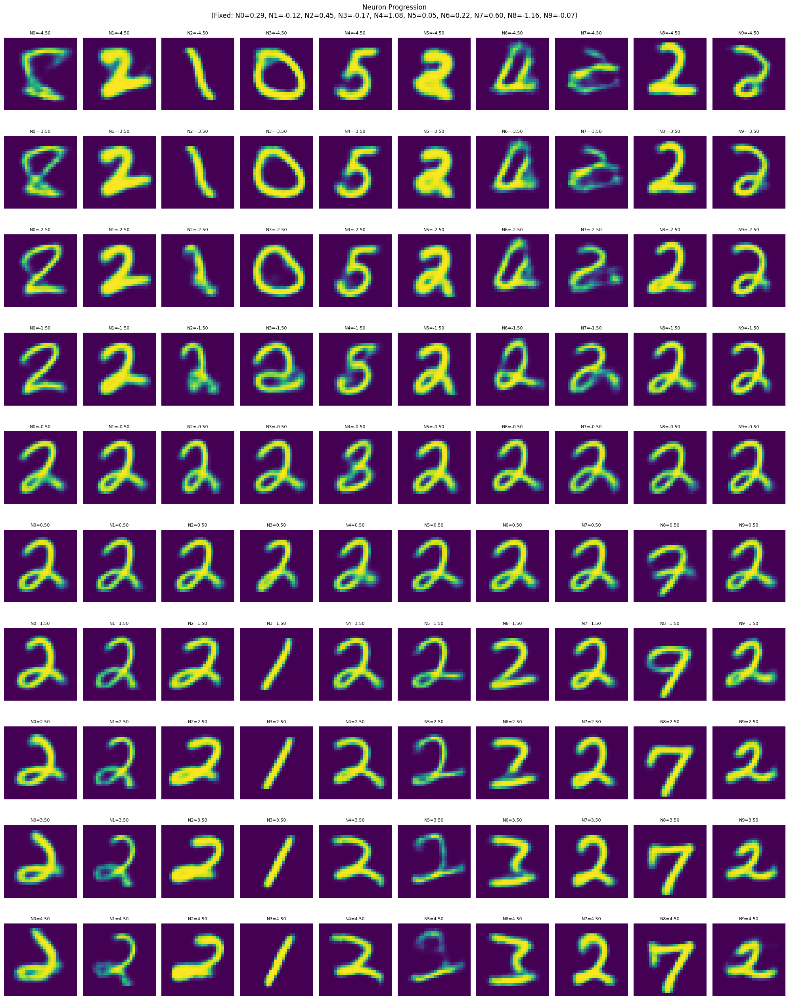

In [18]:
import matplotlib.pyplot as plt
import torch
from torch.distributions import Normal

def generate_images_with_neuron_progression(model, neurons_to_iterate, neuron_values, num_images=16, steps=11, start_value=-2, end_value=2):
    device = next(model.parameters()).device  # Get the device from the model
    model.eval()
    with torch.no_grad():
        dist = Normal(0, 1)
        
        if neurons_to_iterate is all:
            neurons_to_iterate = list(neuron_values.keys())
        elif not isinstance(neurons_to_iterate, list):
            neurons_to_iterate = [neurons_to_iterate]
        
        num_neurons = len(neurons_to_iterate)
        fig, axes = plt.subplots(steps, num_neurons, figsize=(num_neurons*2, steps*2.5))  # Increased figure height
        
        # Ensure axes is always a 2D array
        if num_neurons == 1:
            axes = axes[:, None]
        
        for step in range(steps):
            z = dist.sample((num_images, model.get_latent_dim())).to(device)
            
            for neuron, value in neuron_values.items():
                z[:, neuron] = value
            
            iterated_value = start_value + (end_value - start_value) * step / (steps - 1)
            
            for col, neuron_to_iterate in enumerate(neurons_to_iterate):
                z_neuron = z.clone()
                z_neuron[:, neuron_to_iterate] = iterated_value
                
                generated_images = model.decode(z_neuron).cpu()
                
                ax = axes[step, col]
                ax.imshow(generated_images[0].squeeze(), cmap='viridis')
                ax.axis('off')
                ax.set_title(f"N{neuron_to_iterate}={iterated_value:.2f}", fontsize=8)  # Reduced font size
        
        manipulated_info = ", ".join([f"N{n}={v:.2f}" for n, v in neuron_values.items()])
        plt.suptitle(f"Neuron Progression\n(Fixed: {manipulated_info})", fontsize=12, y=1.02)  # Added line break and adjusted y position
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.999)  # Adjust top margin
        plt.show()

# Example usage:
neuron_values = {
    0: 0.286409,
    1: -0.116093,
    2: 0.454476,
    3: -0.171823,
    4: 1.083852,
    5: 0.051394,
    6: 0.222545,
    7: 0.601464,
    8: -1.161078,
    9: -0.070922,
}
neurons_to_iterate = all  # Use 'all' to iterate over all neurons in neuron_values, a single neuron number or a list can be used as well
start_value = -4.5  # Start of the range
end_value = 4.5  # End of the range
generate_images_with_neuron_progression(model, neurons_to_iterate, neuron_values, num_images=1, steps=10, start_value=start_value, end_value=end_value)

# Manifold representation of two selected neurons

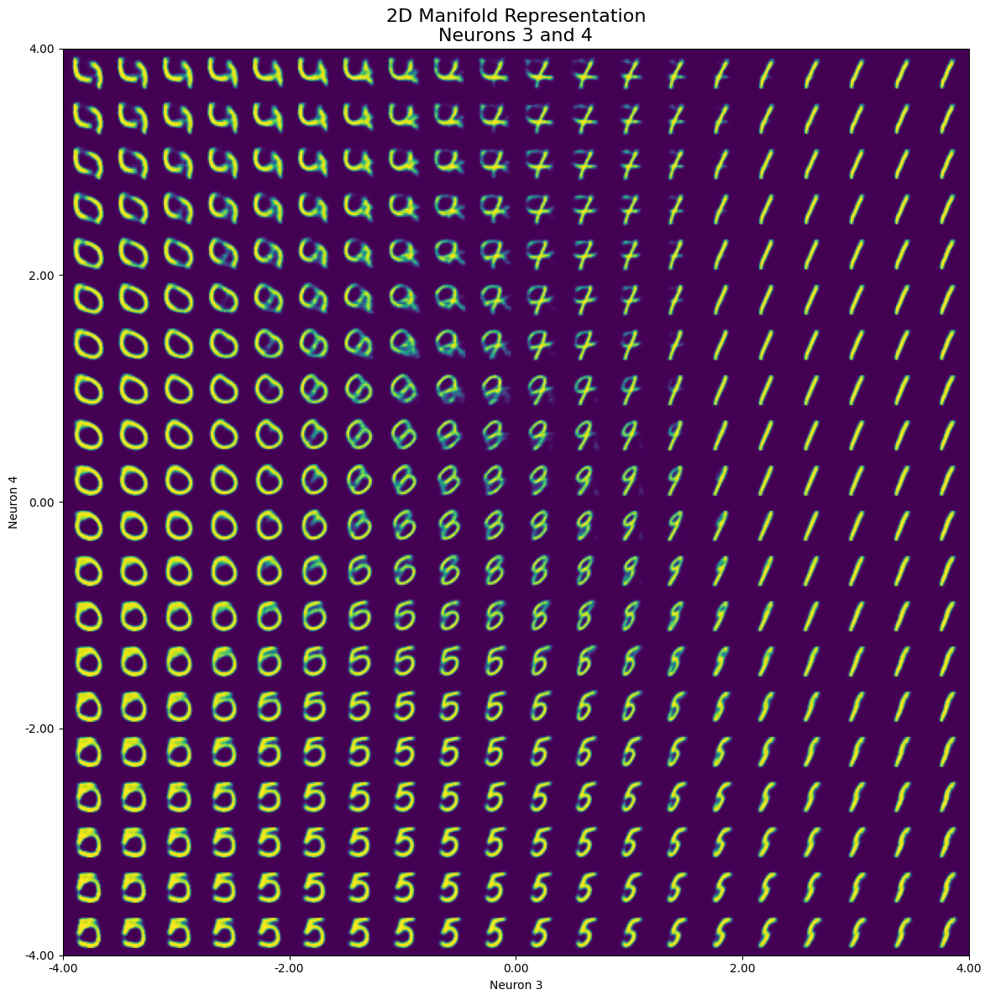

In [128]:
import torch
import torchvision.utils as vutils
from torch.distributions import Normal
import matplotlib.pyplot as plt

def generate_2d_manifold(model, neuron1, neuron2, neuron_values, num_images=16, steps=11, start_value=-2, end_value=2):
    model.eval()
    with torch.no_grad():
        dist = Normal(0, 1)
        
        images = []
        for value1 in torch.linspace(end_value, start_value, steps):
            row_images = []
            for value2 in torch.linspace(start_value, end_value, steps):
                z = dist.sample((num_images, model.latent_dim)).to(device)
                
                for neuron, value in neuron_values.items():
                    z[:, neuron] = value
                
                z[:, neuron1] = value2
                z[:, neuron2] = value1
                
                generated_image = model.decode(z)
                row_images.append(generated_image[0])
            
            images.extend(row_images)
        
        # Create a grid of images
        grid = vutils.make_grid(images, nrow=steps, normalize=True, scale_each=True)
        
        # Convert to numpy for matplotlib and apply colormap
        grid_np = grid.cpu().numpy().transpose((1, 2, 0))
        grid_np = plt.cm.viridis(grid_np[:, :, 0])  # Apply viridis colormap to first channel
        
        # Display the grid
        fig, ax = plt.subplots(figsize=(12, 12))
        im = ax.imshow(grid_np, extent=[start_value, end_value, start_value, end_value])
        
        # Set labels and title
        ax.set_xlabel(f'Neuron {neuron1}')
        ax.set_ylabel(f'Neuron {neuron2}')
        ax.set_title(f'2D Manifold Representation\nNeurons {neuron1} and {neuron2}', fontsize=16)
        
        # Add ticks
        tick_positions = torch.linspace(start_value, end_value, 5)
        ax.set_xticks(tick_positions)
        ax.set_yticks(tick_positions)
        ax.set_xticklabels([f'{x:.2f}' for x in tick_positions])
        ax.set_yticklabels([f'{y:.2f}' for y in tick_positions])
        
        # Add colorbar
        # plt.colorbar(im, ax=ax, label='Pixel values')
        
        plt.tight_layout()
        plt.show()

# Example usage:
neuron_values = {
    0: 0,
    1: 0,
    2: 0,
    3: 0,
    4: 0,
    5: 0,
    6: 0,
    7: 0,
    8: 0,
    9: 0,
}
# Select two neurons to visualize
neuron1 = 3  # Change this to your desired neuron
neuron2 = 4  # Change this to your desired neuron
start_value = -4
end_value = 4
generate_2d_manifold(model, neuron1, neuron2, neuron_values, num_images=1, steps=20, start_value=start_value, end_value=end_value)

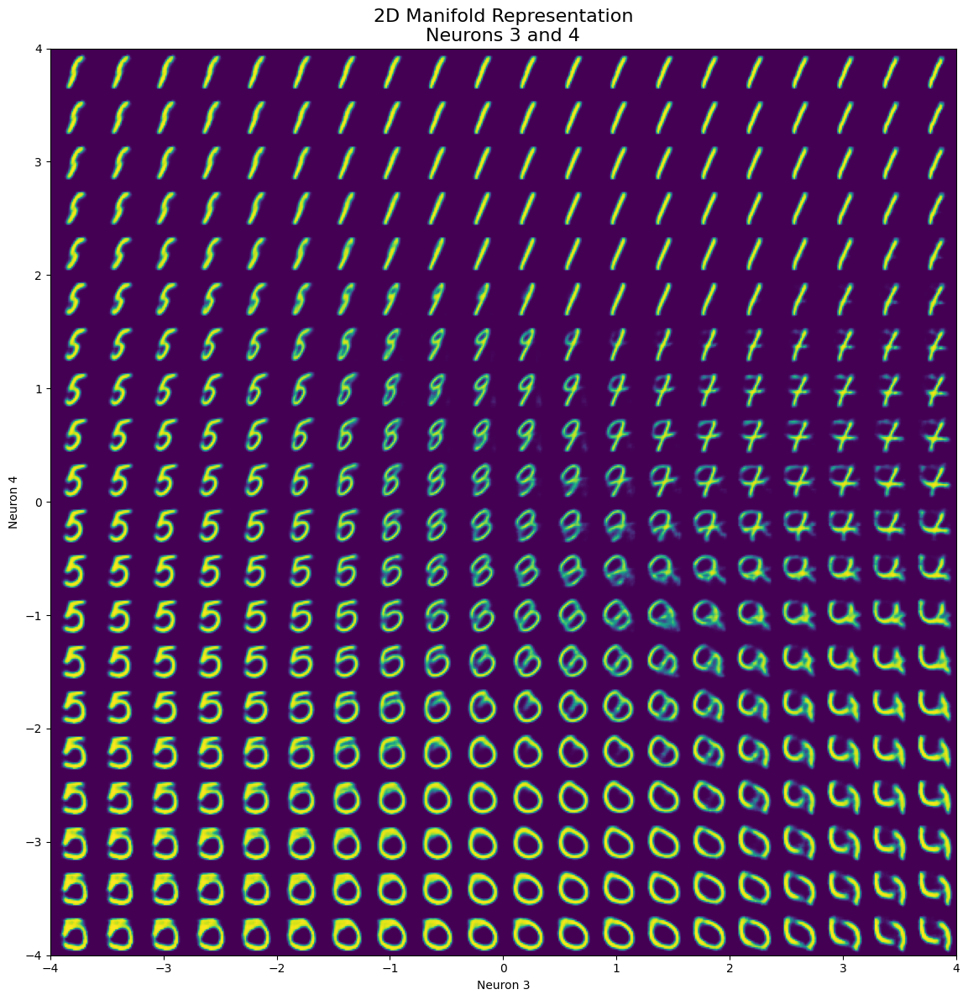

In [112]:
import matplotlib.pyplot as plt
import torch
from torch.distributions import Normal
import numpy as np

def generate_2d_manifold(model, neuron1, neuron2, neuron_values, num_images=16, steps=11, start_value=-2, end_value=2):
    model.eval()
    with torch.no_grad():
        dist = Normal(0, 1)
        
        fig, ax = plt.subplots(figsize=(12, 12))
        
        images = []
        for i, value1 in enumerate(torch.linspace(end_value, start_value, steps)):
            row_images = []
            for j, value2 in enumerate(torch.linspace(start_value, end_value, steps)):
                z = dist.sample((num_images, model.latent_dim)).to(device)
                
                for neuron, value in neuron_values.items():
                    z[:, neuron] = value
                
                z[:, neuron1] = value1
                z[:, neuron2] = value2
                
                generated_image = model.decode(z).cpu()
                row_images.append(generated_image[0].squeeze().numpy())
            
            images.append(row_images)
        
        # Combine all images into a single array
        combined_image = np.concatenate([np.concatenate(row, axis=1) for row in images], axis=0)
        
        # Display the combined image
        im = ax.imshow(combined_image, cmap='viridis', extent=[start_value, end_value, start_value, end_value])
        
        # Set labels and title
        ax.set_xlabel(f'Neuron {neuron1}')
        ax.set_ylabel(f'Neuron {neuron2}')
        ax.set_title(f'2D Manifold Representation\nNeurons {neuron1} and {neuron2}', fontsize=16)
        
        # Remove grid lines
        ax.grid(False)
        
        # Remove color bar (legend)
        # plt.colorbar(im, ax=ax, label='Pixel values')
        
        plt.tight_layout()
        plt.show()

# Example usage:
neuron_values = {
    0: 0,
    1: 0,
    2: 0,
    3: 0,
    4: 0,
    5: 0,
    6: 0,
    7: 0,
    8: 0,
    9: 0,
}

# Select two neurons to visualize
neuron1 = 3  # Change this to your desired neuron
neuron2 = 4  # Change this to your desired neuron

start_value = -4
end_value = 4

generate_2d_manifold(model, neuron1, neuron2, neuron_values, num_images=1, steps=20, start_value=start_value, end_value=end_value)


# Scatter plots for each pair of latent dimensions, color-coded by digit

<Figure size 2000x2000 with 0 Axes>

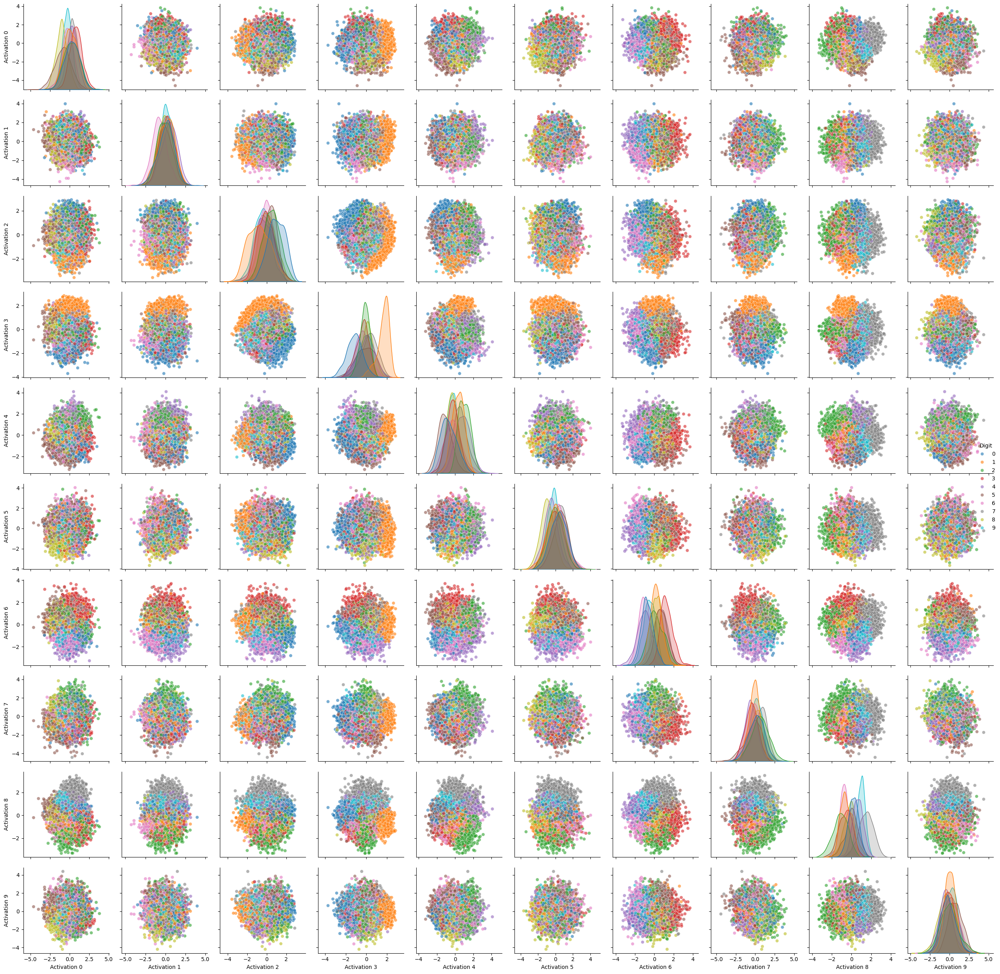

In [132]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def create_pairwise_plots(df):
    # Extract latent representations
    latent_cols = [col for col in df.columns if col.startswith('Activation')]
    X = df[latent_cols].values
    y = df['Digit'].values

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Create a DataFrame with scaled data
    latent_df = pd.DataFrame(X_scaled, columns=latent_cols)
    latent_df['Digit'] = y

    # Create a color palette based on 'tab10' colormap
    cmap = plt.get_cmap('tab10')
    unique_digits = np.unique(y)
    palette = {digit: cmap(i) for i, digit in enumerate(unique_digits)}

    # Create pairwise plots
    plt.figure(figsize=(20, 20))
    sns.pairplot(latent_df, hue='Digit', vars=latent_cols, diag_kind='kde', plot_kws={'alpha': 0.6}, palette=palette)
    plt.tight_layout()
    plt.show()

# Call the function
create_pairwise_plots(df)


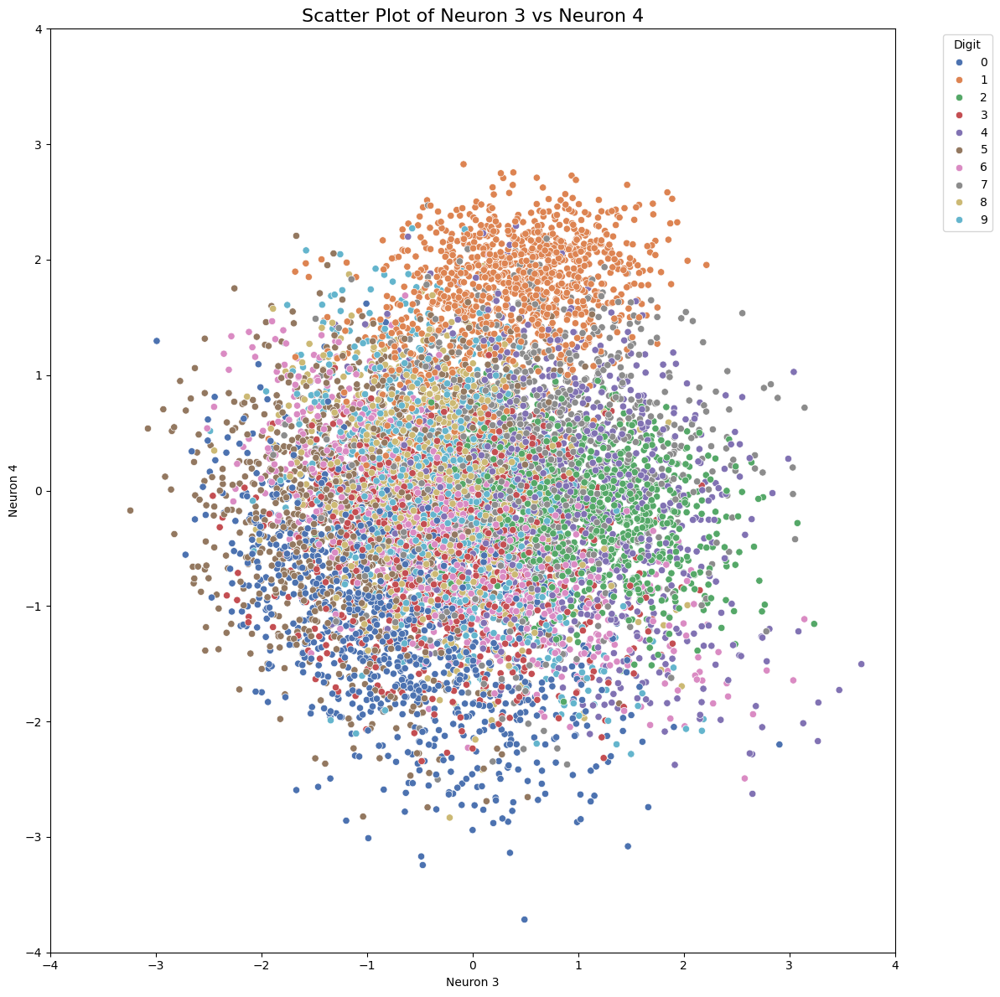

In [131]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def visualize_selected_neurons(df, neuron1, neuron2, start_value=-4, end_value=4):
    # Extract latent representations
    activation_cols = [f'Activation {neuron2}', f'Activation {neuron1}']
    X = df[activation_cols].values
    y = df['Digit'].values

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Create a DataFrame with scaled data
    plot_df = pd.DataFrame(X_scaled, columns=[f'Neuron {neuron2}', f'Neuron {neuron1}'])
    plot_df['Digit'] = y

    # Create the scatter plot
    plt.figure(figsize=(12, 12))
    sns.scatterplot(data=plot_df, x=f'Neuron {neuron2}', y=f'Neuron {neuron1}', hue='Digit', palette='deep', legend='full')
    plt.title(f'Scatter Plot of Neuron {neuron1} vs Neuron {neuron2}', fontsize=16)
    plt.xlabel(f'Neuron {neuron1}')
    plt.ylabel(f'Neuron {neuron2}')
    plt.legend(title='Digit', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Set axis limits to match the manifold plot
    plt.xlim(start_value, end_value)
    plt.ylim(start_value, end_value)

    plt.tight_layout()
    plt.show()

# Select two neurons to visualize
neuron1 = 3
neuron2 = 4 
start_value = -4
end_value = 4

# Call the function
visualize_selected_neurons(df, neuron1, neuron2, start_value, end_value)

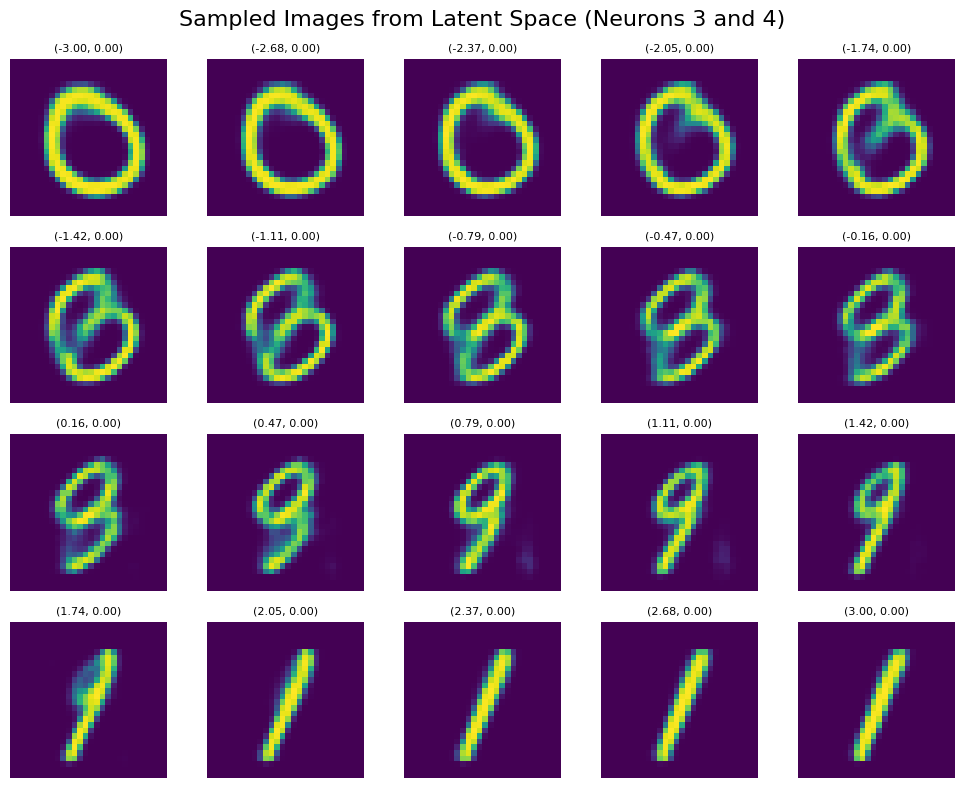

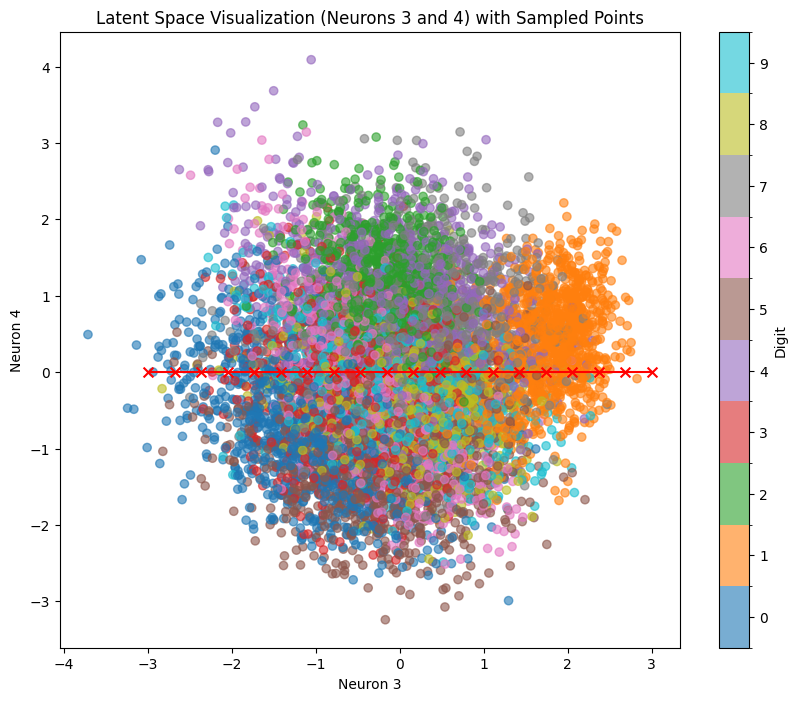

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
import matplotlib as mpl
from sklearn.preprocessing import StandardScaler
import torch

def sample_and_visualize_latent_space(df, model, device, neuron1, neuron2, sampling_points=None, line_start=None, line_end=None, n_line_samples=10):
    # Extract latent representations
    latent_cols = [col for col in df.columns if col.startswith('Activation')]
    X = df[latent_cols].values
    y = df['Digit'].values

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Select the two specified neurons
    X_selected = X_scaled[:, [neuron1, neuron2]]

    # Define sampling points
    if sampling_points is not None:
        grid_points = np.array(sampling_points)
    elif line_start is not None and line_end is not None:
        grid_points = np.linspace(np.array(line_start), np.array(line_end), n_line_samples)
    else:
        raise ValueError("Either sampling_points or line_start and line_end must be provided.")

    # Generate images from sampled latent points
    model.eval()
    with torch.no_grad():
        # Create full latent vectors
        sampled_latent_points = np.zeros((len(grid_points), X.shape[1]))
        sampled_latent_points[:, neuron1] = grid_points[:, 0]
        sampled_latent_points[:, neuron2] = grid_points[:, 1]
        
        # Inverse transform the standardized data
        sampled_latent_points = scaler.inverse_transform(sampled_latent_points)
        
        latent_tensor = torch.FloatTensor(sampled_latent_points).to(device)
        generated_images = model.decode(latent_tensor).cpu().numpy()

    # Visualize generated images with coordinates
    n_samples = len(grid_points)
    n_cols = min(5, n_samples)
    n_rows = (n_samples - 1) // n_cols + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2*n_cols, 2*n_rows))
    fig.suptitle(f"Sampled Images from Latent Space (Neurons {neuron1} and {neuron2})", fontsize=16)
    for idx, ax in enumerate(axes.flatten()):
        if idx < n_samples:
            ax.imshow(generated_images[idx].reshape(28, 28), cmap='viridis')
            ax.axis('off')
            coord = grid_points[idx]
            ax.set_title(f"({coord[0]:.2f}, {coord[1]:.2f})", fontsize=8)
        else:
            ax.set_visible(False)
    plt.tight_layout()
    plt.show()

    # Define colors for plotting
    n_classes = len(np.unique(y))
    cmap = plt.get_cmap('tab10')
    norm = BoundaryNorm(np.arange(-0.5, n_classes + 0.5, 1), cmap.N)

    # Plot latent space with sampling points
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_selected[:, 0], X_selected[:, 1], c=y, cmap=cmap, norm=norm, alpha=0.6)
    plt.colorbar(scatter, ticks=np.arange(n_classes), label='Digit')
    plt.scatter(grid_points[:, 0], grid_points[:, 1], c='red', s=50, marker='x')
    
    if line_start is not None and line_end is not None:
        plt.plot([line_start[0], line_end[0]], [line_start[1], line_end[1]], 'r-')
    
    plt.title(f'Latent Space Visualization (Neurons {neuron1} and {neuron2}) with Sampled Points')
    plt.xlabel(f'Neuron {neuron1}')
    plt.ylabel(f'Neuron {neuron2}')
    plt.show()

# Example usage:
# Assuming df is your DataFrame, model is your VAE, and device is your torch device

# Select two neurons to visualize
neuron1 = 3  # Change this to your desired neuron
neuron2 = 4  # Change this to your desired neuron

# # Option 1: Custom points
# custom_points = [
#     [-2, 2], [-1, 2], [0, 2], [1, 2], [2, 2],
#     [-2, 0], [-1, 0], [0, 0], [1, 0], [2, 0],
#     [-2, -2], [-1, -2], [0, -2], [1, -2], [2, -2]
# ]
# sample_and_visualize_latent_space(df, model, device, neuron1, neuron2, sampling_points=custom_points)

# Option 2: Line sampling
line_start = [-3, 0]
line_end = [3, 0]
sample_and_visualize_latent_space(df, model, device, neuron1, neuron2, line_start=line_start, line_end=line_end, n_line_samples=20)

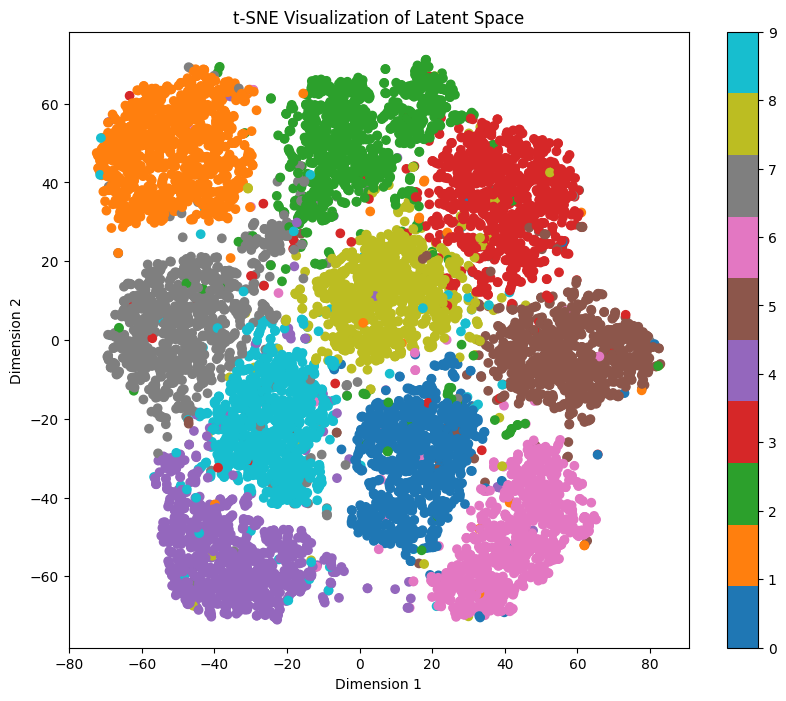

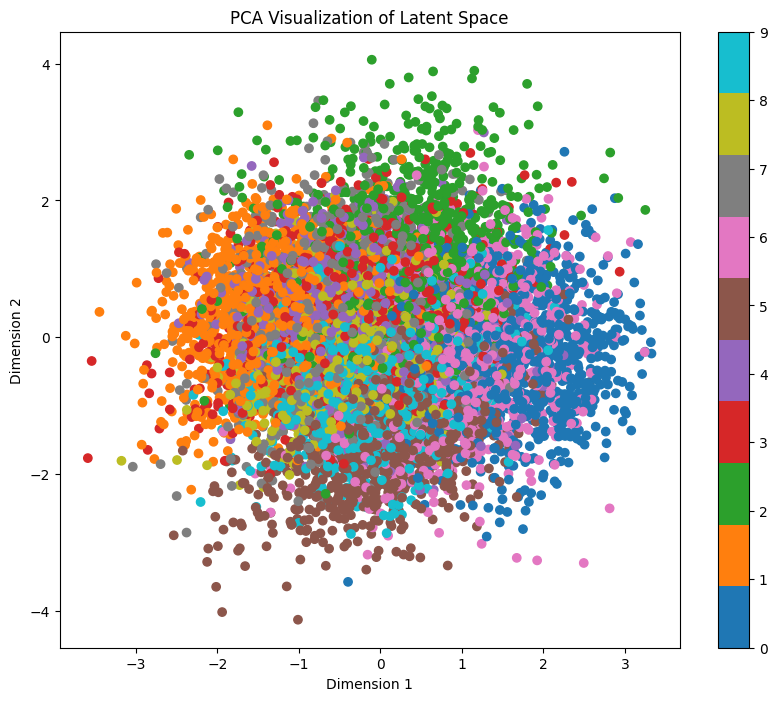

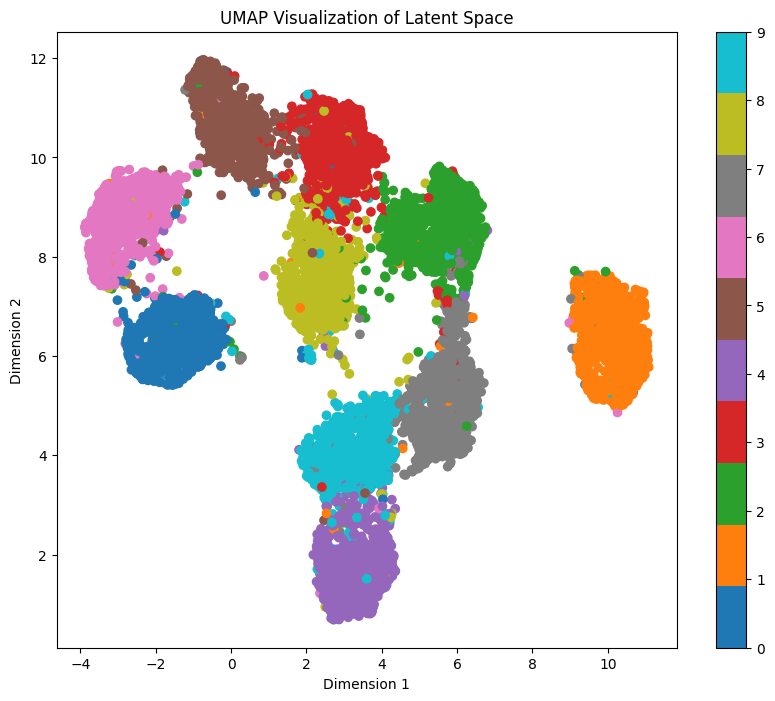

In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.preprocessing import StandardScaler

def plot_embedding(X, y, title):
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X[:, 0], X[:, 1], c=y, cmap='tab10')
    plt.colorbar(scatter)
    plt.title(title)
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()

def create_visualizations(df):
    # Extract latent representations
    latent_cols = [col for col in df.columns if col.startswith('Activation')]
    X = df[latent_cols].values
    y = df['Digit'].values

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X_scaled)
    plot_embedding(X_tsne, y, 't-SNE Visualization of Latent Space')

    # PCA
    pca = PCA(n_components=2, random_state=42)
    X_pca = pca.fit_transform(X_scaled)
    plot_embedding(X_pca, y, 'PCA Visualization of Latent Space')

    # Print explained variance ratio for PCA
    # print(f"PCA explained variance ratio: {pca.explained_variance_ratio_}")

    # UMAP
    umap_model = UMAP(n_components=2, random_state=42, n_jobs=1)
    X_umap = umap_model.fit_transform(X_scaled)
    plot_embedding(X_umap, y, 'UMAP Visualization of Latent Space')

# Assuming df is your DataFrame
create_visualizations(df)

<Figure size 2000x2000 with 0 Axes>

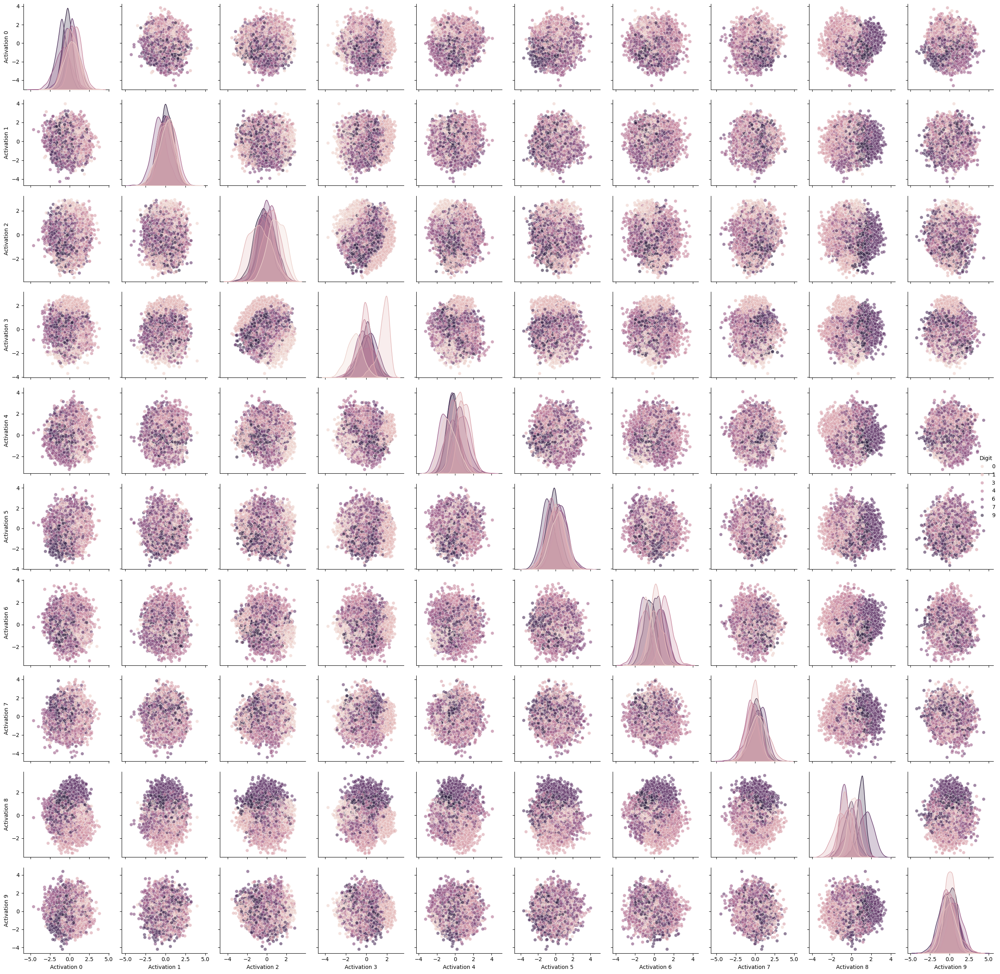

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

def create_pairwise_plots(df):
    # Extract latent representations
    latent_cols = [col for col in df.columns if col.startswith('Activation')]
    X = df[latent_cols].values
    y = df['Digit'].values

    # Standardize the data
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Create a DataFrame with scaled data
    latent_df = pd.DataFrame(X_scaled, columns=latent_cols)
    latent_df['Digit'] = y

    # Create pairwise plots
    plt.figure(figsize=(20, 20))
    sns.pairplot(latent_df, hue='Digit', vars=latent_cols, diag_kind='kde', plot_kws={'alpha': 0.6})
    plt.tight_layout()
    plt.show()

# Call the function
create_pairwise_plots(df)

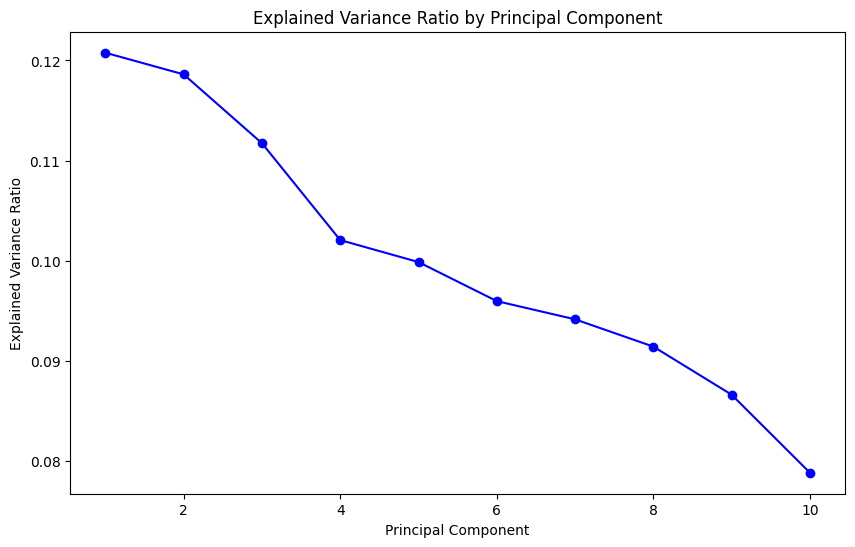

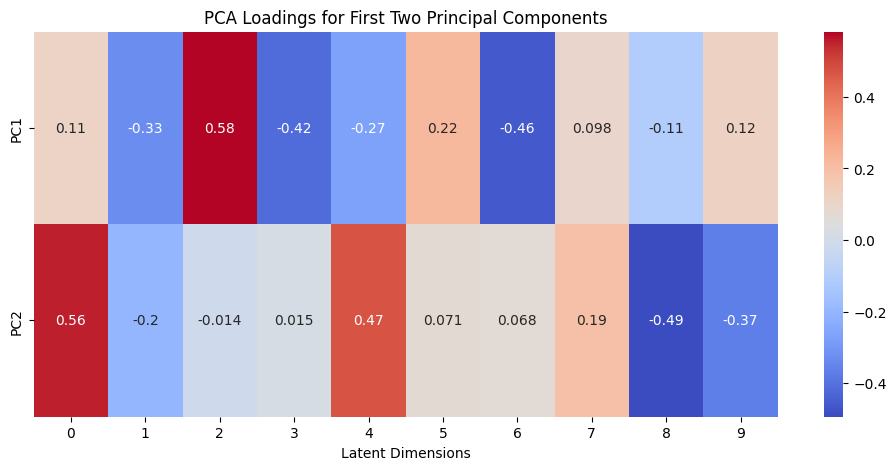

Cumulative explained variance ratio:
[0.1207695  0.23937652 0.35110927 0.45316768 0.55303025 0.64899325
 0.7431378  0.8345579  0.9211742  0.9999998 ]


In [35]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_pca_latent(df):
    # Extract latent representations
    latent_cols = [col for col in df.columns if col.startswith('Activation')]
    X = df[latent_cols].values
    
    # Perform PCA
    pca = PCA()
    pca.fit(X)
    
    # Plot explained variance ratio
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, 'bo-')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.title('Explained Variance Ratio by Principal Component')
    plt.show()
    
    # Plot loadings of first two principal components
    loadings = pca.components_[:2, :]
    plt.figure(figsize=(12, 5))
    sns.heatmap(loadings, annot=True, cmap='coolwarm', yticklabels=['PC1', 'PC2'])
    plt.xlabel('Latent Dimensions')
    plt.title('PCA Loadings for First Two Principal Components')
    plt.show()
    
    print("Cumulative explained variance ratio:")
    print(pca.explained_variance_ratio_.cumsum())

# Call the function
analyze_pca_latent(df)

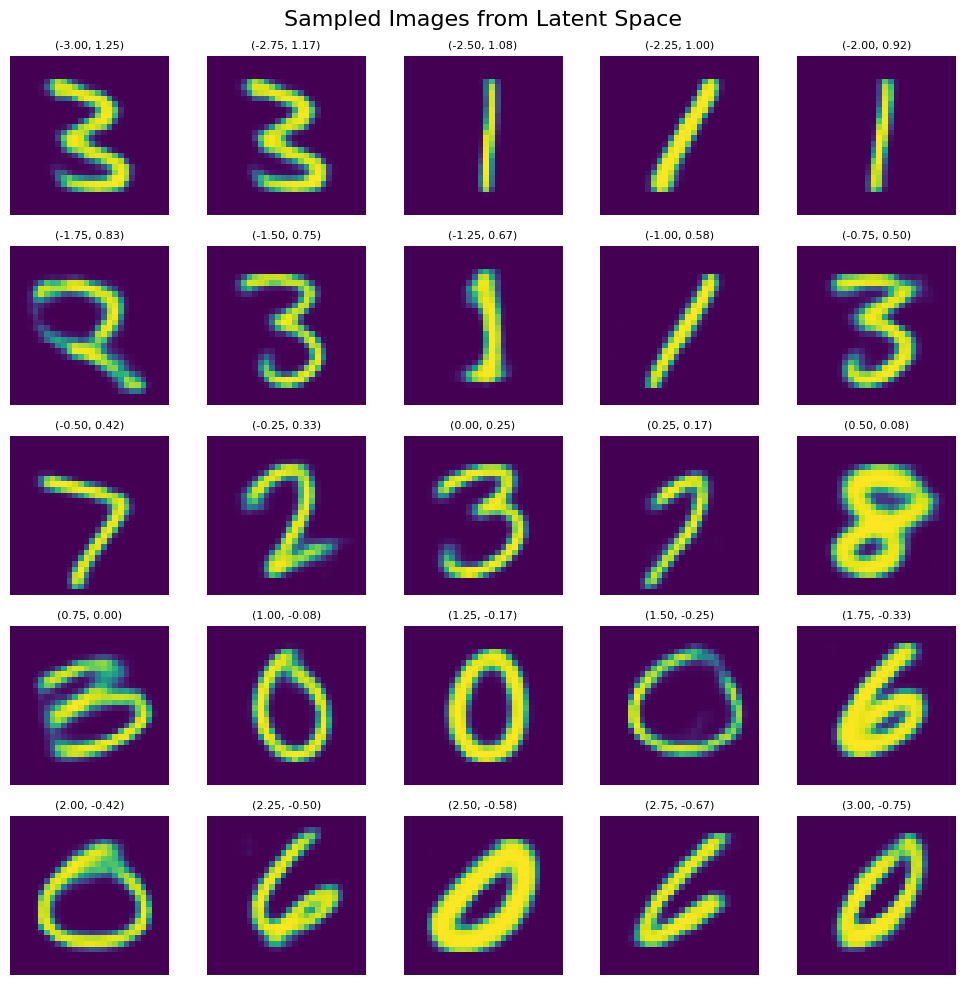

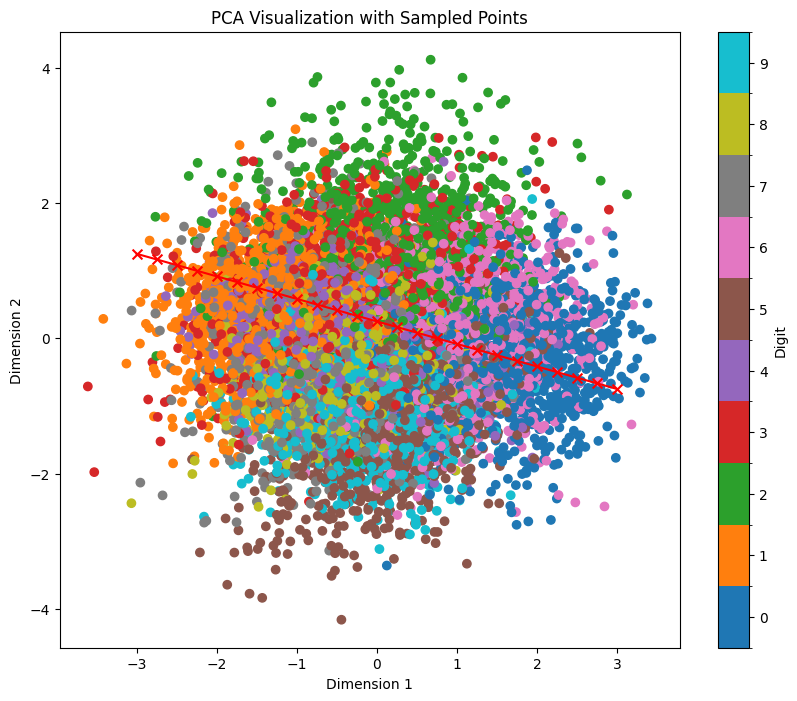

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm
import matplotlib as mpl
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from umap import UMAP
import torch

def sample_and_visualize_latent_space(df, model, device, method='umap', sampling_points=None, line_start=None, line_end=None, n_line_samples=10):
    # Extract latent representations
    latent_cols = [col for col in df.columns if col.startswith('Activation')]
    X = df[latent_cols].values
    y = df['Digit'].values

    # Perform dimensionality reduction
    if method == 'umap':
        reducer = UMAP(n_components=2, random_state=42, n_jobs=1)
    elif method == 'tsne':
        reducer = TSNE(n_components=2, random_state=42)
    elif method == 'pca':
        reducer = PCA(n_components=2)
    else:
        raise ValueError("Method must be one of 'umap', 'tsne', or 'pca'")
    
    X_reduced = reducer.fit_transform(X)

    # Define sampling points
    if sampling_points:
        grid_points = np.array(sampling_points)
    elif line_start and line_end:
        grid_points = np.linspace(np.array(line_start), np.array(line_end), n_line_samples)
    else:
        raise ValueError("Either sampling_points or line_start and line_end must be provided.")

    # Find nearest neighbors in reduced space
    nn = NearestNeighbors(n_neighbors=1, metric='euclidean')
    nn.fit(X_reduced)
    _, indices = nn.kneighbors(grid_points)

    # Get corresponding latent space points
    sampled_latent_points = X[indices.flatten()]

    # Generate images from sampled latent points
    model.eval()
    with torch.no_grad():
        latent_tensor = torch.FloatTensor(sampled_latent_points).to(device)
        generated_images = model.decode(latent_tensor).cpu().numpy()

    # Visualize generated images with coordinates
    n_samples = len(grid_points)
    n_cols = min(5, n_samples)
    n_rows = (n_samples - 1) // n_cols + 1
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(2*n_cols, 2*n_rows))
    fig.suptitle("Sampled Images from Latent Space", fontsize=16)

    for idx, ax in enumerate(axes.flatten()):
        if idx < n_samples:
            ax.imshow(generated_images[idx].reshape(28, 28), cmap='viridis')
            ax.axis('off')
            coord = grid_points[idx]
            ax.set_title(f"({coord[0]:.2f}, {coord[1]:.2f})", fontsize=8)
        else:
            ax.set_visible(False)

    plt.tight_layout()
    plt.show()

    # Define colors for plotting
    n_classes = len(np.unique(y))
    cmap = mpl.colormaps['tab10']
    norm = BoundaryNorm(np.arange(-0.5, n_classes + 0.5, 1), n_classes)

    # Plot reduced space with sampling points
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=y, cmap=cmap, norm=norm)
    plt.colorbar(scatter, ticks=np.arange(n_classes), label='Digit')
    plt.scatter(grid_points[:, 0], grid_points[:, 1], c='red', s=50, marker='x')
    
    if line_start and line_end:
        plt.plot([line_start[0], line_end[0]], [line_start[1], line_end[1]], 'r-')
    
    plt.title(f'{method.upper()} Visualization with Sampled Points')
    plt.xlabel('Dimension 1')
    plt.ylabel('Dimension 2')
    plt.show()

# Example usage:
# Assuming df is your DataFrame and model is your VAE

# Option 1: Custom points
# custom_points = [
#     [-4, 7], [-2, 7], [0, 7], [2, 7], [4, 7],
#     [-4, 0], [-2, 0], [0, 0], [2, 0], [4, 0],
#     [-4, -7], [-2, -7], [0, -7], [2, -7], [4, -7]
# ]
# sample_and_visualize_latent_space(df, model, device, method='tsne', sampling_points=custom_points)

# Option 2: Line sampling
line_start = [-3, 1.25]
line_end = [3, -0.75]
sample_and_visualize_latent_space(df, model, device, method='pca', line_start=line_start, line_end=line_end, n_line_samples=25)
